In [9]:
# %load_ext autoreload
# %autoreload 2
%matplotlib inline

In [10]:
from matplotlib.font_manager import _rebuild; _rebuild()

In [11]:


# import matplotlib
from matplotlib import pyplot as plt
from matplotlib import font_manager
from matplotlib.font_manager import _rebuild; _rebuild()
import os

# style setting
# matplotlib.style.use('seaborn-white')

# font setting
fp = font_manager.FontProperties(fname=os.path.expanduser('~/.fonts/ipaexg.ttf'))
plt.rcParams['font.family'] = fp.get_name()


In [12]:
import os
import sys
sys.path.append('..')
import torch

import params
from lavse.data.loaders import get_loader
from lavse.model import model
from lavse.train.train import Trainer
from lavse.utils import file_utils, helper
from lavse.utils.logger import create_logger
from run import load_yaml_opts, parse_loader_name
from tqdm import tqdm
from lavse.data.collate_fns import Collate
from lavse.utils import layers
import json
from PIL import Image
import numpy as np
from lavse.train.evaluation import predict_loader
from matplotlib import font_manager as fm, rcParams
from matplotlib.font_manager import FontProperties
import matplotlib.pyplot as plt
import matplotlib
# matplotlib.rc('font', family='fonts-japanese-mincho')
# matplotlib.rc('font', family='Arial')
# matplotlib.rcParams['font.fantasy'] = 'Ubuntu'
from torchvision import transforms
collate = Collate('liwe')

In [13]:
model_path = '../logs/jap_precomp.jt/liwe-adamax/best_model.pkl'
opt = load_yaml_opts('../logs/jap_precomp.jt/liwe-adamax/options.yaml')

In [14]:
ngpu = 1
loaders = []

if 'DATA_PATH' not in os.environ:
    data_path = '/opt/jonatas/datasets/lavse'
#     data_path = '../lavse'
#     data_path = opt.dataset.data_path
else:
    data_path = os.environ['DATA_PATH']


print(opt.dataset.lang)
opt.dataset.vocab_paths = ['../{}'.format(p) for p in opt.dataset.vocab_paths]
for data_name in opt.dataset.val.data:
    data_name, lang = parse_loader_name(data_name)
    print(data_name)
    loader = get_loader(
        data_split='test',
        data_path=data_path,
        data_name=data_name,
        loader_name=opt.dataset.loader_name,
        local_rank=0,
        lang=lang,
        text_repr=opt.dataset.text_repr,
        vocab_paths=opt.dataset.vocab_paths,
        ngpu=ngpu,
        **opt.dataset.val,
    )
    loaders.append(loader)

device = torch.device('cuda:0')

print(len(loaders))
loader = loaders[0]
tokenizers = loader.dataset.tokenizers
if type(tokenizers) != list:
    tokenizers = [tokenizers]

{}
jap_precomp
Image div 5
1


In [15]:
# load model and options
model = model.LAVSE(**opt.model, tokenizers=tokenizers)#.to(device)
checkpoint = helper.restore_checkpoint(
    path=model_path,
    model=model,
)

model.set_devices_(
    txt_devices=[device],
    img_devices=[device],
    loss_device=device,
)
is_master = True
model.master = is_master # FIXME: Replace "if print" by built_in print


In [17]:
img_embs, cap_embs, cap_lens = predict_loader(model, loader, device)
print(img_embs.shape, cap_embs.shape)
# img_embs /= np.linalg.norm(img_embs, axis=1, keepdims=True)
# cap_embs /= np.linalg.norm(cap_embs, axis=1, keepdims=True)
print(img_embs.shape, cap_embs.shape)

(977, 1024) (4885, 1024)
(977, 1024) (4885, 1024)


In [18]:
ids = np.load('/opt/jonatas/datasets/lavse/jap_precomp/test_ids.npy')
new_ids = np.zeros((len(ids)*5), dtype=np.int64)
for i in range(len(ids)):
    new_ids[i*5:(i*5)+5] = ids[i]
    
loader.dataset.ids = new_ids
print(ids.min(), ids.max(), ids.mean())

jp_caps = np.loadtxt('/opt/jonatas/datasets/lavse/jap_precomp/test_caps.jp.txt', delimiter='@', dtype='unicode')

1589 581770 295001.5353121801


In [19]:
# with open('/opt/jonatas/datasets/lavse/f30k/dataset_flickr30k.json', 'r') as fp:
#     flickr = json.load(fp)
#     f30k = {x['filename']: x for x in flickr['images']}
with open('/opt/jonatas/datasets/lavse/jap_precomp/yjcaptions26k/yjcaptions26k_clean.json', 'r') as fp:
    flickr = json.load(fp)

In [20]:
new_info = {x['id']: x for x in flickr['images']}

flickr['images'][0]


{'license': 4,
 'file_name': 'COCO_train2014_000000000030.jpg',
 'coco_url': 'http://mscoco.org/images/30',
 'height': 428,
 'width': 640,
 'date_captured': '2013-11-24 03:32:32',
 'flickr_url': 'http://farm4.staticflickr.com/3377/3573516590_a1f6cf2cbd_z.jpg',
 'id': 30}

In [21]:
flickr['images'][0]

{'license': 4,
 'file_name': 'COCO_train2014_000000000030.jpg',
 'coco_url': 'http://mscoco.org/images/30',
 'height': 428,
 'width': 640,
 'date_captured': '2013-11-24 03:32:32',
 'flickr_url': 'http://farm4.staticflickr.com/3377/3573516590_a1f6cf2cbd_z.jpg',
 'id': 30}

In [22]:
img_embs, cap_embs, cap_lens = torch.tensor(img_embs), torch.tensor(cap_embs), torch.tensor(cap_lens)
sims = model.get_sim_matrix_shared(
        embed_a=img_embs, embed_b=cap_embs,
        lens=cap_lens, shared_size=128
    )
sims = layers.tensor_to_numpy(sims)
print(sims.shape)
new_sims = np.zeros((4885, 4885))
for i in range(977):
    new_sims[i*5:(i*5)+5] = sims[i]
sims = new_sims
print(sims.shape)

(977, 4885)
(4885, 4885)


In [23]:
print(sims.min(), sims.max(), sims.mean())
print(type(sims))

-0.31286752223968506 0.7506911158561707 0.0012373004158082136
<class 'numpy.ndarray'>


In [24]:
len(flickr['images'])

26500

# TEXT2IMAGE

sim1k (4885, 977)
テ ー ブ ル の 上 に 白 の 花 瓶 が 置 い て あ り ま す 。


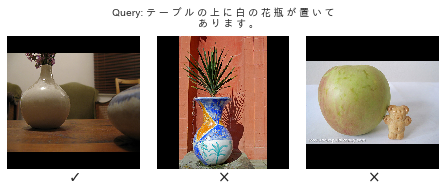

草 原 を 一 頭 の シ マ ウ マ が 歩 い て い ま す 。


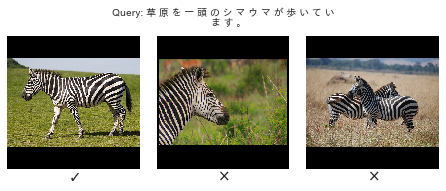

ス ー ツ 姿 の 黒 人 男 性 が マ イ ク の 前 に 立 っ て い ま す 。


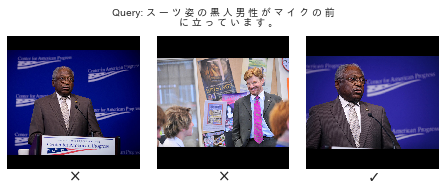

金 柵 の 前 に は 注 意 書 き の 看 板 が あ り ま す 。


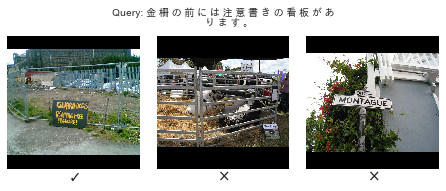

白 い パ ソ コ ン が デ ス ク に 置 か れ て い ま す 。


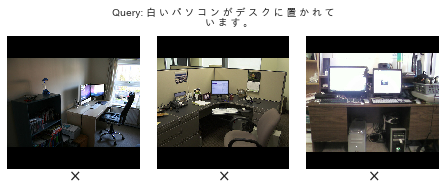

ジ ュ ー ス 瓶 に 黄 色 と 青 色 の 花 が 生 け ら れ て い ま す 。


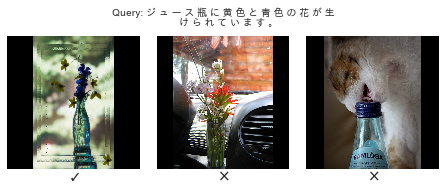

木 の 傍 の 芝 生 の 上 で 、 複 数 の シ マ ウ マ が 草 を 食 べ て い ま す 。


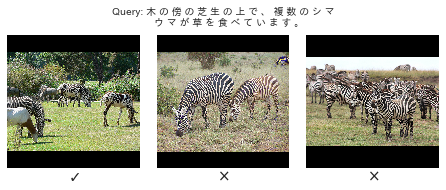

若 い 女 性 が 海 で サ ー フ ィ ン を し よ う と し て い ま す


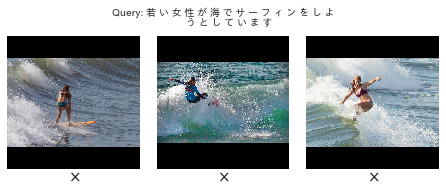

紙 皿 に ピ ザ が 一 切 れ の せ ら れ て い ま す 。


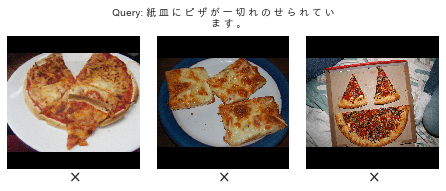

ア メ リ カ の 団 体 が 主 催 の 会 議 で 、 男 性 が ス ピ ー チ を し て い ま す 。


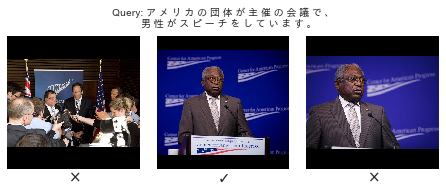

テ ニ ス コ ー ト で テ ニ ス を し て い る 人 が い ま す 。


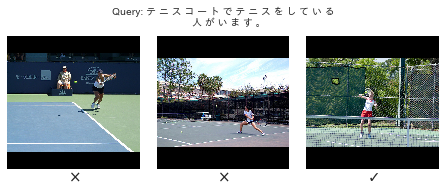

写 真 や ア ー ト 絵 画 が か か っ た 緑 色 の 壁 の 部 屋 で す 。


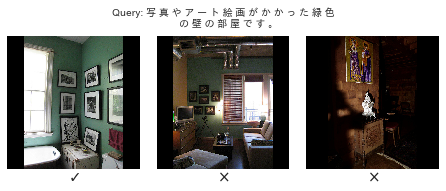

厨 房 で 何 か の 作 業 を す る 人 が い ま す 。


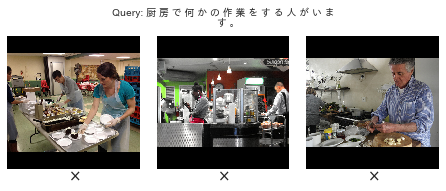

女 性 が キ ッ チ ン で 料 理 を 作 っ て い ま す 。


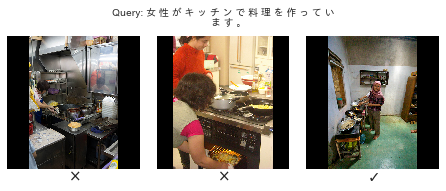

ビ ル と ビ ル の 間 に 外 壁 に 時 計 が 付 い て い る タ ワ ー が あ り ま す 。


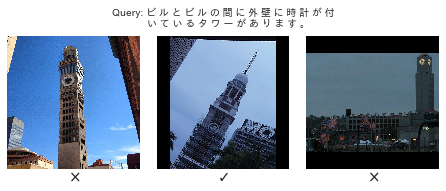

床 の 上 に い く つ か の カ バ ン が 置 い て あ り ま す 。


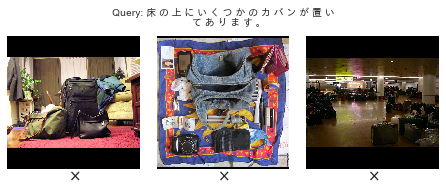

ゲ レ ン デ で ス ノ ー ボ ー ド を し て い る 人 が い ま す 。


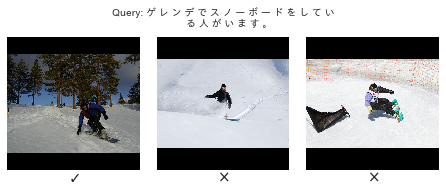

部 屋 に テ ー ブ ル と ソ フ ァ が 置 か れ て い ま す 。


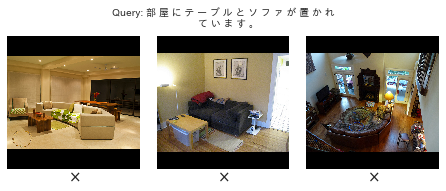

角 地 の 店 舗 の 落 書 き さ れ た シ ャ ッ タ ー の 前 で 、 眼 鏡 を 頭 に ず ら し た 女 性 が 立 っ て い る 写 真 で す 。


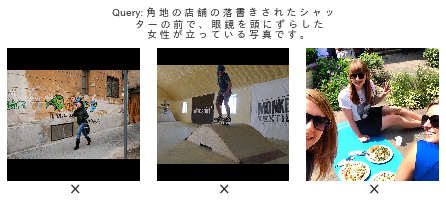

車 線 の 先 の 歩 道 に は 複 数 の 道 路 標 識 が 掲 げ ら れ て い ま す 。


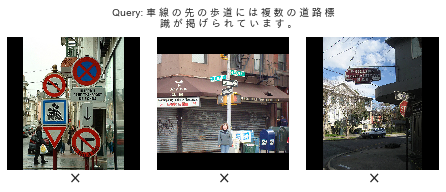

草 原 に ト ラ ッ ク の 廃 車 体 が 放 置 さ れ て い ま す 。


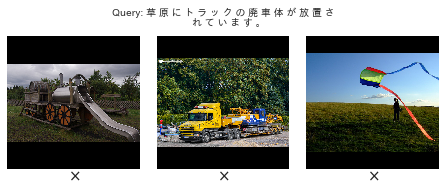

屋 外 に 置 か れ た 机 の 上 に 、 花 が 飾 ら れ て い ま す 。


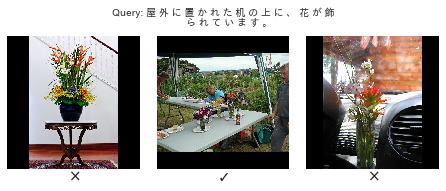

バ ナ ナ の 実 が な っ て い る と こ ろ で す 。


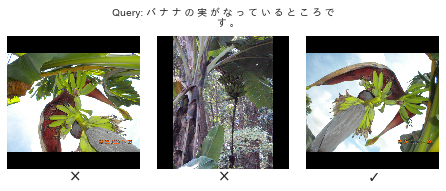

線 路 の 上 に 黒 と オ レ ン ジ で 塗 装 さ れ た 列 車 が あ り ま す 。


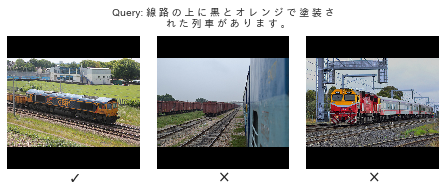

バ イ ク に ま た が っ た 男 性 が 、 電 話 の よ う な 物 を 見 て い ま す 。


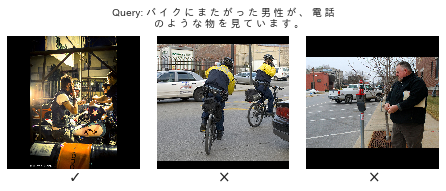

椅 子 の 背 も た れ に 一 羽 の 小 鳥 が と ま っ て い ま す 。


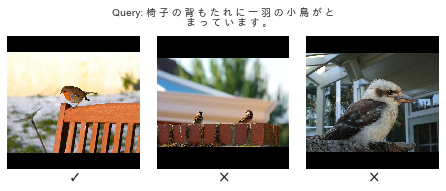

雪 山 で ス ノ ー ボ ー ド を 履 い た 人 が 、 立 っ て い ま す 。


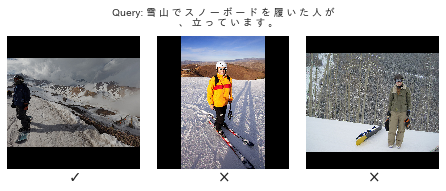

バ ス ケ ッ ト ボ ー ル を し て い る 黒 い 服 装 の 女 性 が 一 人 写 っ て い ま す 。


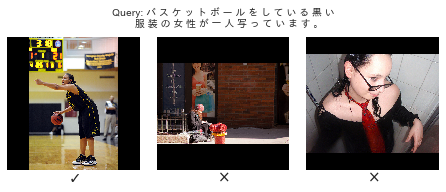

猫 が 広 い ベ ッ ド の 上 で 寝 そ べ っ て い ま す 。


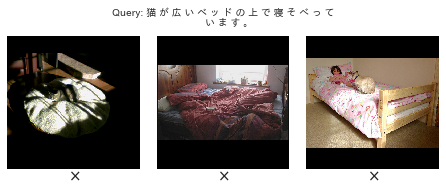

ハ ー ト 型 を し た 大 き な ピ ザ が 置 か れ て い ま す 。


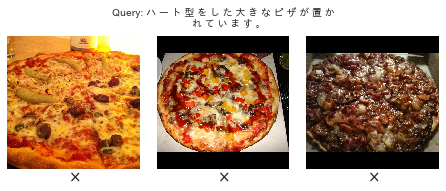

毛 足 の 長 い 黒 い 猫 が ソ フ ァ の 上 に 置 か れ た 帽 子 の 中 に 入 っ て い ま す 。


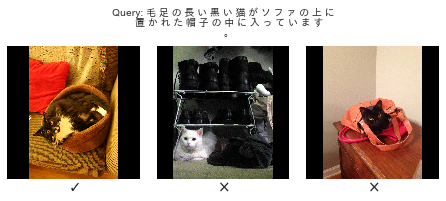

ピ ザ が 置 か れ た テ ー ブ ル に 座 っ て い る 側 で 左 手 の 親 指 を 立 て た 人 が い ま す 。


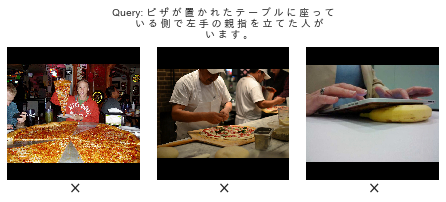

ラ ッ ク に 、 大 き な ス テ ン レ ス の 扉 の つ い た 機 器 が 設 置 さ れ て お り 、 機 器 の 上 部 と 右 側 に 操 作 パ ネ ル が あ り ま す 。


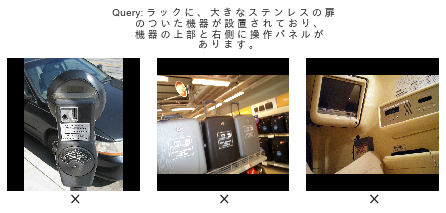

白 と 黄 緑 の バ ス が 道 路 を 走 っ て い ま す 。


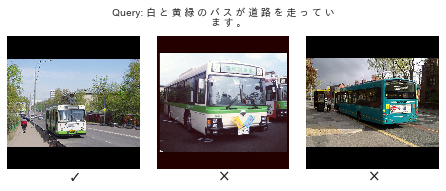

白 い ク ル ー ザ ー に は 白 い 犬 が ２ 匹 乗 っ て い ま す


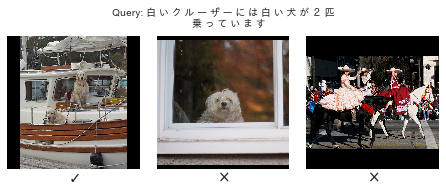

メ ー タ ー の 片 方 に 青 い 袋 が か ぶ せ ら れ て い ま す 。


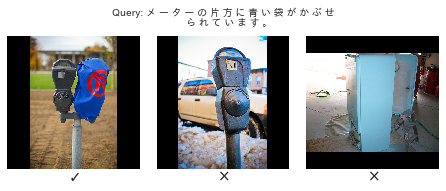

２ 本 の 道 路 標 識 の 手 前 に 白 い 車 が あ り ま す 。


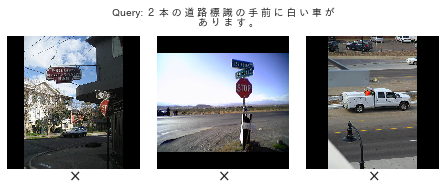

今 ま さ に 滑 走 路 か ら 飛 び 立 と う と し て い る 旅 客 機 で す 。


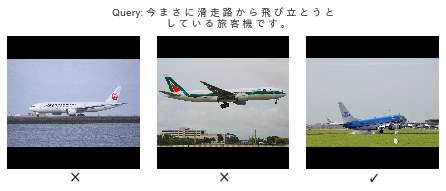

ス ケ ボ ー に 乗 っ て ブ ロ ッ ク 塀 を 滑 っ て い ま す 。


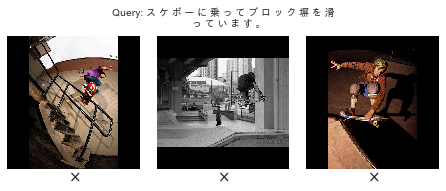

木 の 枝 に 鳥 が と ま っ て い る と こ ろ で す 。


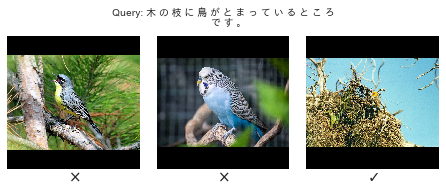

海 岸 に サ ー フ ボ ー ド を 頭 に 載 せ た 人 が 歩 い て い ま す 。


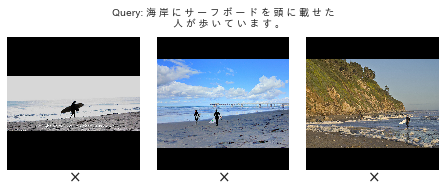

交 差 点 の 真 ん 中 で 黒 い 服 を 着 た 人 が 立 っ て い ま す 。


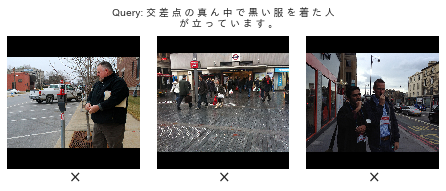

塔 の 上 に 何 十 匹 と い う 鳩 が と ま っ て い ま す 。


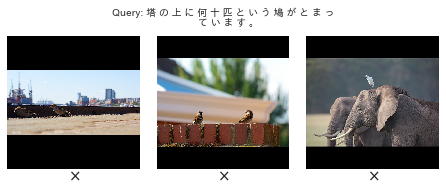

１ 頭 の 象 が 野 原 を 歩 い て い ま す 。


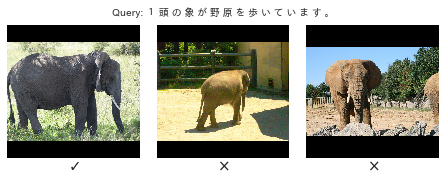

た く さ ん の 犬 た ち が え さ を 食 べ て い ま す 。


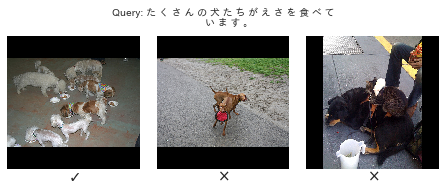

青 い 容 器 の 中 に 、 リ ン ゴ が 入 っ て い ま す 。


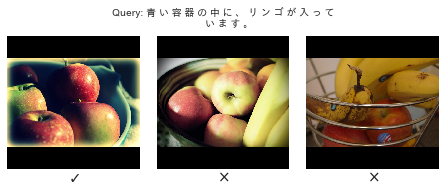

ス ー ツ ケ ー ス と 狐 の 襟 巻 き が あ り ま す 。


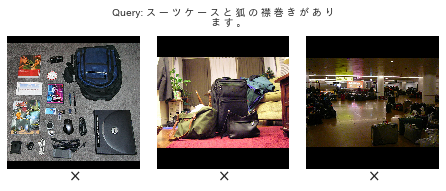

道 路 を 自 転 車 に 乗 っ た 人 が 走 っ て い ま す 。


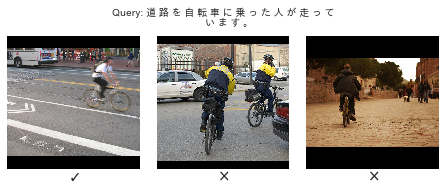

洗 面 所 の 右 側 に 、 タ オ ル が 置 か れ て い ま す 。


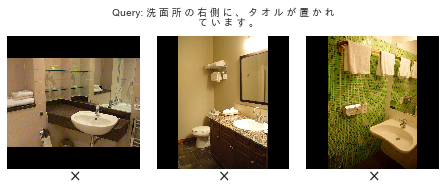

大 き な 時 計 が つ い た 大 き な 白 い 建 物 で す 。


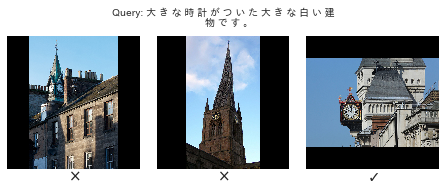

茶 色 い 犬 が 窓 か ら 外 の 景 色 を み て い ま す 。


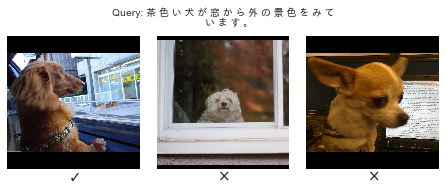

お 皿 に ケ ー キ が ２ つ 乗 り 、 フ ォ ー ク が 添 え て あ り ま す 。


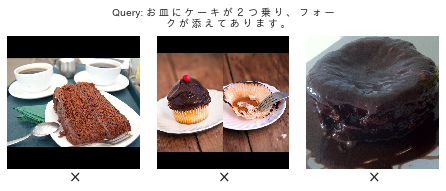

レ ン ガ 造 り の 建 物 前 に 、 2 つ の ベ ン チ が あ り ま す 。


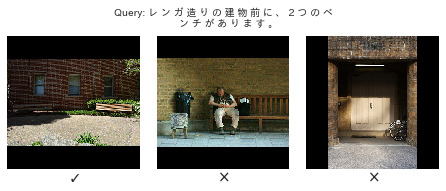

白 い ド ア の 周 り が 、 赤 く 縁 ど ら れ て い ま す 。


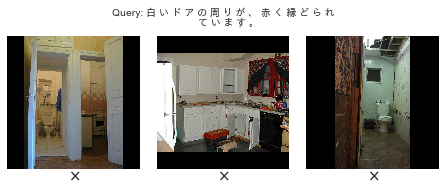

部 屋 に は 薄 型 の テ レ ビ と 木 製 の 整 理 ダ ン ス が き れ い に 並 べ て あ り ま す 。


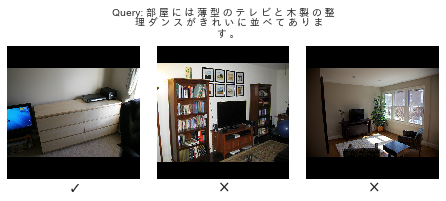

洗 面 所 の 壁 に 、 タ オ ル が 2 枚 掛 か っ て い ま す 。


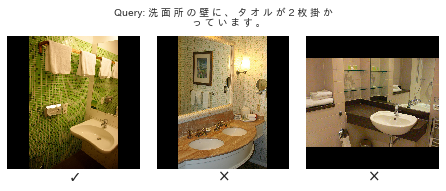

白 に 茶 色 の 柄 が あ る 皿 に 、 ホ ッ ト ド ッ グ と 、 小 さ く 切 っ た ウ イ ン ナ ー が ３ 切 れ の っ て い ま す 。


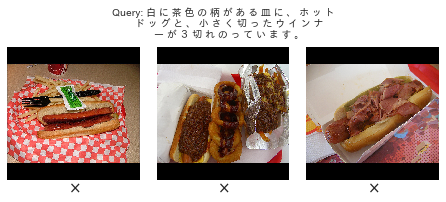

着 陸 し た 飛 行 機 に 作 業 車 が つ い て い ま す 。


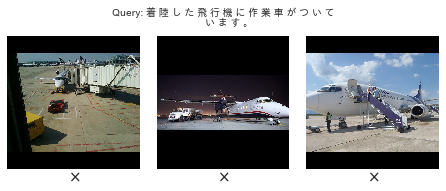

建 物 を 背 景 に 男 性 が ス ケ ボ ー を し て い ま す 。


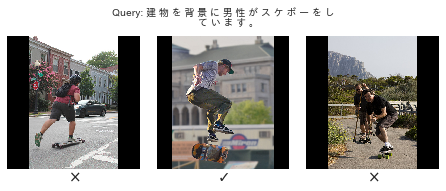

矢 印 の マ ー キ ン グ が さ れ た 床 の 上 で ス ケ ー ト ボ ー ド を し て い る 人 が い ま す 。


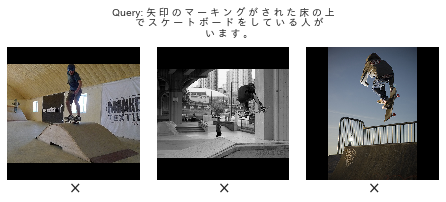

広 場 で ス ケ ボ ー を し て い る 人 達 が い ま す 。


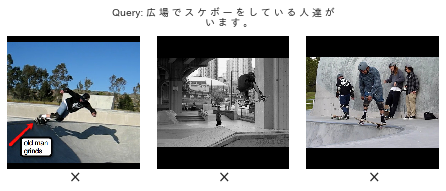

市 松 模 様 の 床 の 上 を 歩 く 黒 い 犬 。


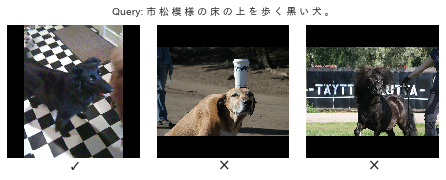

夜 の 交 差 点 で 一 人 の 男 性 が 真 ん 中 に 立 っ て い ま す 。


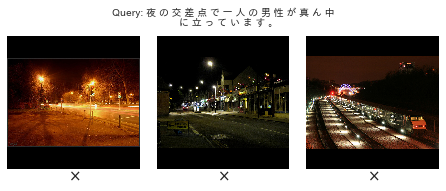

ス ノ ー ウ ェ ア を 着 用 し た 人 が 雪 の 上 を ス ノ ー ボ ー ド で 滑 っ て い ま す 。


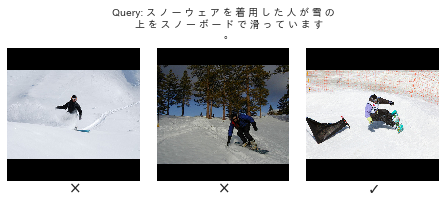

ス ノ ー ボ ー ド を し て い る 人 の 後 ろ に 、 ネ ッ ト が あ り ま す 。


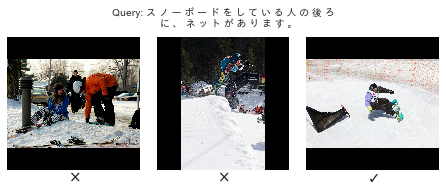

口 を く っ つ け た 二 頭 の キ リ ン が い ま す 。


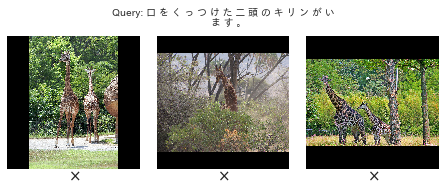

ノ ー ト パ ソ コ ン の キ ー ボ ー ド の 上 に 黒 い 猫 が 足 を 乗 せ て い ま す 。


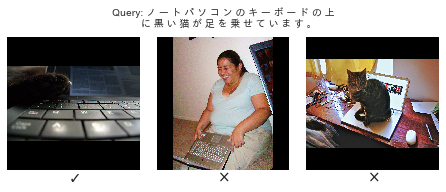

砂 利 道 を 二 頭 の 牛 が 横 切 っ て い ま す 。


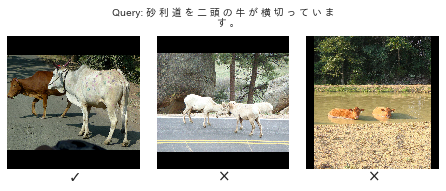

コ ン ク リ ー ト の 上 に い る 、 馬 が 2 頭 で 馬 の お 尻 に は 、 文 字 が 書 か れ て い ま す 。


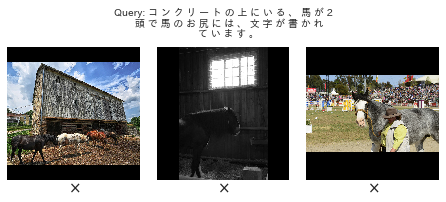

女 性 が 壁 に 落 書 き が た く さ ん し て あ る 歩 道 を 歩 い て い る 。


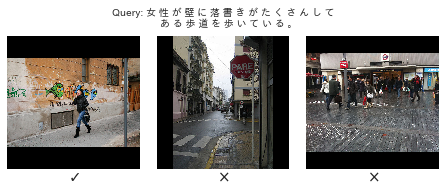

オ レ ン ジ の ベ ス ト を 着 た 女 性 が ２ 人 い ま す 。


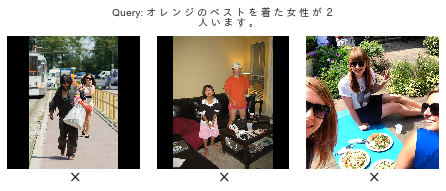

容 器 に 入 れ ら れ た 歯 ブ ラ シ が 置 か れ て い ま す 。


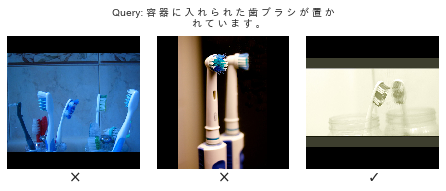

ビ ル が 立 ち 並 び 、 横 断 歩 道 の あ る 丁 字 路 で す 。


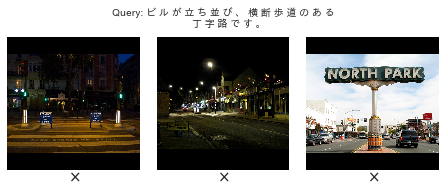

シ ェ ア ハ ウ ス の ベ ッ ド ル ー ム の 模 様 替 え


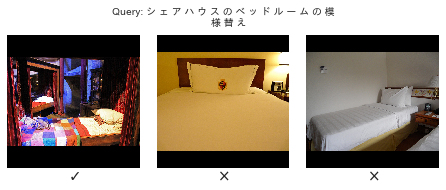

ス キ ー を は い た 女 性 が 雪 の 上 に 立 っ て い ま す 。


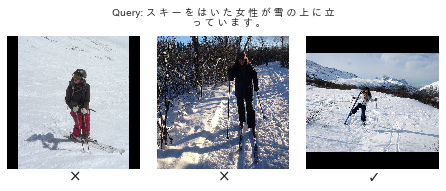

こ の 個 室 は 白 色 で 統 一 さ れ て い る ト イ レ で す 。


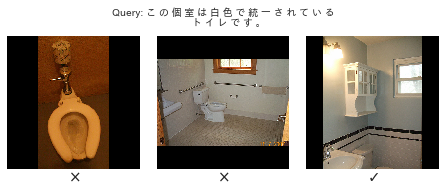

鳥 の 巣 の 塊 の 横 に 黄 色 い 鳥 が 止 ま っ て い ま す 。


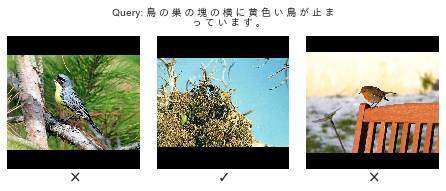

雪 山 で ス キ ー の 格 好 を し た 女 性 が 立 っ て い ま す 。


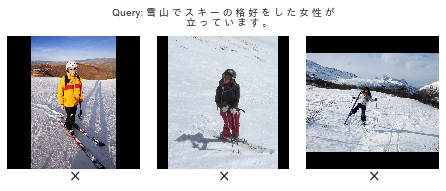

洗 面 台 の 洗 い 場 に ネ コ が 立 っ て い ま す 。


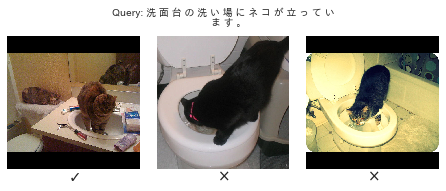

オ レ ン ジ 色 の 果 物 が 皿 に 盛 っ て あ り ま す 。


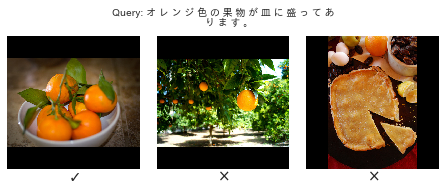

人 が 海 上 で サ ー フ ボ ー ド に 乗 っ て い ま す 。


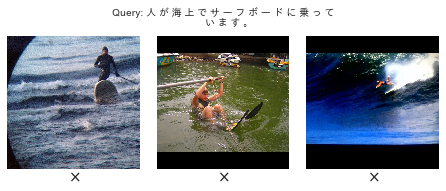

男 性 が ベ ン チ に 座 っ て 二 匹 の 犬 を 抱 い て い ま す 。


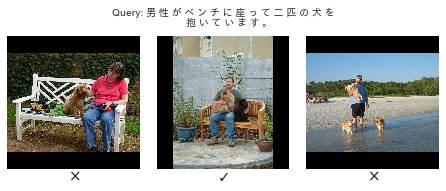

庭 に 割 れ た 瓶 で ア ー ト が 作 ら れ て い ま す 。


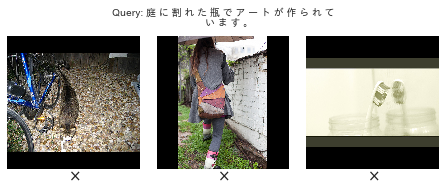

茶 色 の テ ー ブ ル の 上 に ハ ー ト 型 の ピ ザ が 置 か れ て い ま す 。


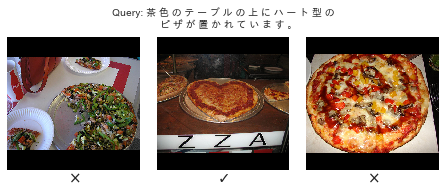

木 の そ ば に キ リ ン が 二 頭 立 っ て い ま す 。


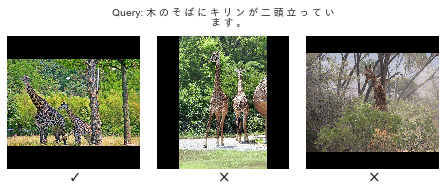

サ ラ ダ と ジ ュ ー ス を 食 べ て い る 人 の 手 元 で す 。


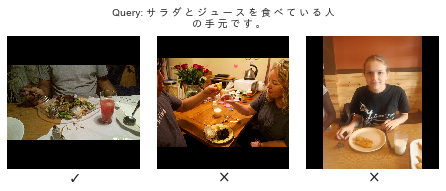

テ ー ブ ル の 上 に は ピ ザ が 置 か れ 、 そ の 奥 に は 瓶 が あ り ま す 。


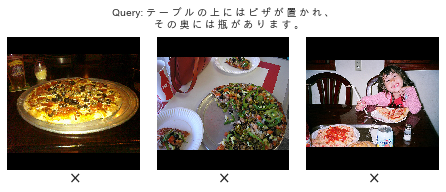

牛 小 屋 に い る 牛 の 前 に 餌 が 巻 か れ て い る 。


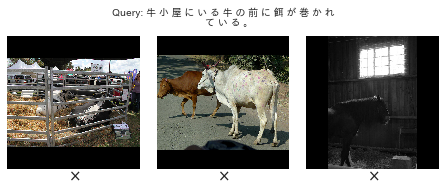

牛 舎 で 、 牛 た ち が 並 ん で 餌 を 食 べ て い ま す 。


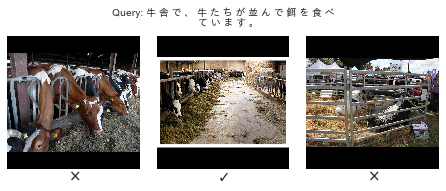

男 の 人 が 荷 物 を 抱 え て 女 の 人 の 前 を 歩 い て い ま す 。


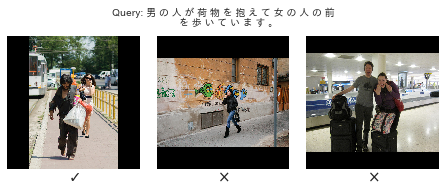

テ ー ブ ル の 上 に 料 理 が 並 べ ら れ て い ま す 。


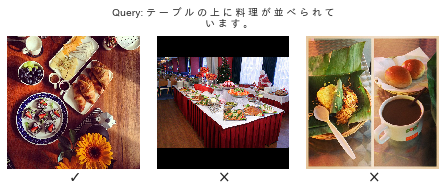

ス ノ ー ボ ー ド で 滑 り 下 り て い る 人 が い ま す 。


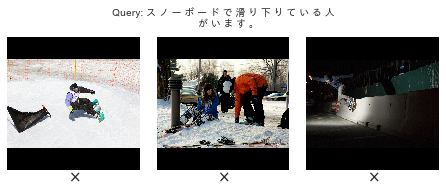

赤 い キ ャ ン ピ ン グ カ ー の 横 に 女 性 が い て 、 後 ろ に は 1 頭 の 馬 が い ま す 。


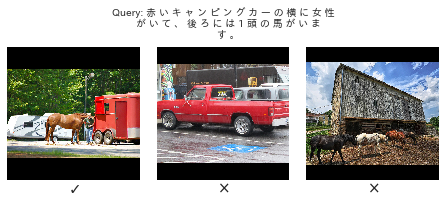

時 計 が 予 め 据 付 け ら れ て い る 講 壇 が あ り ま す 。


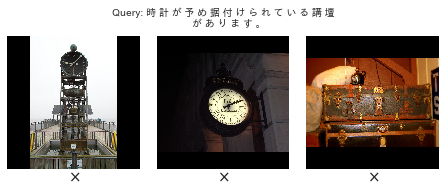

黒 い キ ャ ッ プ を か ぶ っ た 男 性 が ス ケ ボ ー を し て い ま す 。


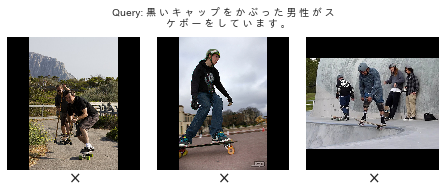

長 い 牙 の 象 が 屋 根 の あ る 場 所 で 飼 育 さ れ て い ま す 。


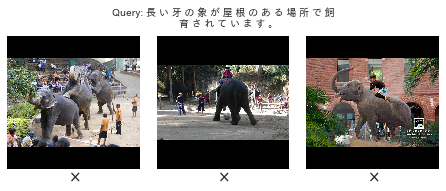

テ ー ブ ル の 上 に は 、 タ ン ブ ラ ー と ス イ ッ チ が 入 っ た 縦 型 の モ ニ タ ー が 置 い て あ り ま す 。


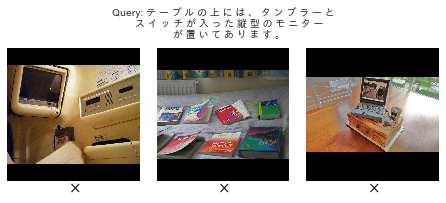

列 車 の 形 を し た 、 滑 り 台 も つ い て い る 遊 具 で す 。


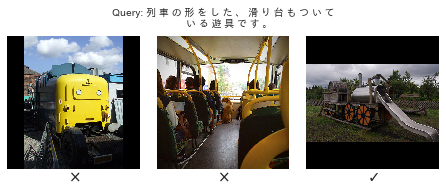

赤 い 服 を 着 た 人 が 、 ス ケ ー ト ボ ー ド の 上 に 立 っ て い ま す 。


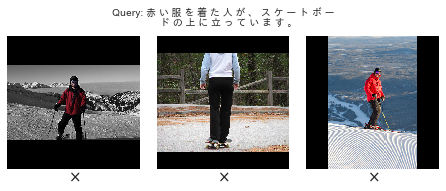

普 通 の バ ス の 後 ろ に 、 ２ 階 建 て の バ ス が い ま す 。


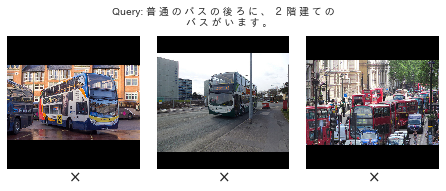

In [28]:
# text 2 img
lang = 'jp'
sims_t = sims.T
sims_t1k = sims_t[:, range(0, sims_t.shape[1], 5)]
print('sim1k', sims_t1k.shape)
inds = np.argsort(sims_t1k, axis=1)[:, ::-1]

ld = loader

cap_idx = 51

for cap_idx in np.random.choice(4885, 100, replace=False):
#     cap = ld.dataset.captions[cap_idx]
    cap = jp_caps[cap_idx]
    print(cap)

    n = 15
    if cap.endswith('.'):
        cap = cap[:-2]
    split_str = cap.split(' ')
    if len(split_str) > n:
        for j in range(n, len(split_str), n):
            split_str[j-1] += '\n   '
    cap = ' '.join(split_str)
    cap = '{}: {}'.format('Query', cap)

    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.gca().set_axis_off()
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.axis('off')
    plt.subplots_adjust(bottom=0, top=1, left=0, right=1, wspace=0, hspace=0)


    ax.set_axis_off()
    fig.add_axes(ax)

    imgs = []
    preds = []
    for i in range(0, 3):
        img_idx = inds[cap_idx, i] * 5
        pred = cap_idx in range(img_idx, img_idx + 5)
        preds.append(pred)

        # restore original indexes
        img_id = int(ld.dataset.ids[img_idx])
        img_info = new_info[img_id]
#         img_info = flickr['images'][img_id]
        img_set = img_info['file_name'].split('_')[1]
        img = Image.open(os.path.join('/opt/jonatas/datasets/lavse/coco/images', img_set, img_info['file_name']))
        crop = transforms.CenterCrop(max(img.size))
        img = crop(img).resize((400,400))
        img = np.asarray(img)
        if i < 2:
            img = np.pad(img, [[0,0], [0,50], [0,0]], mode='constant', constant_values=255)
        imgs.append(img)

    imgs = np.hstack(imgs)
    ax.imshow(imgs)
    plt.text(imgs.shape[1]/2., -30, cap, fontsize=10, horizontalalignment='center')
    first = 200
    for i in range(3):
        symb = '$\checkmark$' if preds[i] else '$\\times$'
        plt.text(first, img.shape[0] + 35, symb, fontsize=15, horizontalalignment='center')
        first += 450
    plt.savefig('/home/jonatas/retrieval_imgs/t2i/{}/t2i_{}_{}.pdf'.format(lang, lang, cap_idx), bbox_inches='tight', dpi=166, pad_inches=0)
    plt.show()
    plt.close()
    

# old code below

---------------------------

In [ ]:
import matplotlib.font_manager
matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')

In [ ]:
# success cases
lang = loader.dataset.lang
print('sim matrix shape', sims.shape)
inds = np.argsort(sims, axis=1)[:, ::-1]
print('inds shape', inds.shape)
from matplotlib.transforms import Bbox

max_length = 60
ld = loader
for k in np.random.choice(np.arange(5, 5000, 5), 100, replace=False):#range(5, 5000, 5):
    img_ix = k
    img_id = int(ld.dataset.ids[img_ix])
#     print 'img id', img_id
    img_info = flickr['images'][img_id]
    img = Image.open(os.path.join('/opt/jonatas/datasets/lavse/f30k/images/flickr30k_images', img_info['filename']))
    crop = transforms.CenterCrop(max(img.size))
    img = crop(img).resize((400,400))

    fig = plt.figure(figsize=(4, 4))
#     fig.patch.set_visible(False)
    ax = fig.add_subplot(111)
    plt.axis('off')
    plt.subplots_adjust(bottom=0, top=1, left=0, right=1, wspace=0, hspace=0)
    
    
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img)
    gt = range(img_ix, img_ix + 5)

    preds = []
    caps = []
    for i in range(5):
        pred = inds[img_ix, i] in gt
        preds.append(pred)
        caps.append(ld.dataset.captions[inds[img_ix, i]])

    n = 8
    big_str = []
    biggest_cap = 0
    for i in range(5):
        cap = caps[i]
        if cap.endswith('.'):
            cap = cap[:-2]
        split_str = cap.split(' ')
        if len(split_str) > n:
            for j in range(n, len(split_str), n):
                split_str[j-1] += '\n   '
        split_str = ' '.join(split_str)
        symb = '$\checkmark$' if preds[i] else '$\\times$'
        br = ''
        if i < 4:
            br = '\n\n'
        
        new_cap = ''.join(split_str) + '.'
        
            
        big_str.append('{}. {} {}{}'.format((i+1), new_cap, symb, br))
    text = ''.join(big_str)
    ax.text(img.width + 30, img.height/2, text, verticalalignment='center', fontsize=15)
    
#     if all(preds):
#         print("all corect found :)")
    plt.savefig('/home/douglas/retrieval_imgs/i2t/random/{}/t2i_{}_{}.pdf'.format(lang, lang, img_ix), bbox_inches=Bbox([[0,0],[10,4]]), dpi=166, pad_inches=0)
    if k % 500 == 0:
        print('processed {} images'.format(k/5))
#     plt.show()
    plt.close()
#     break


In [ ]:
# failure cases

print 'sim matrix shape', sims.shape
inds = np.argsort(sims, axis=1)[:, ::-1]
print 'inds shape', inds.shape
from matplotlib.transforms import Bbox

max_length = 60

ld = loader_de

img_ix = 815
img_id = int(ld.dataset.ids[img_ix])
img_info = flickr['images'][img_id]
img = Image.open(os.path.join('/opt/datasets/flickr/flickr30k_images', img_info['filename']))
crop = transforms.CenterCrop(max(img.size))
img = crop(img).resize((400,400))

fig = plt.figure(figsize=(4, 4))
ax = fig.add_subplot(111)
plt.axis('off')
plt.subplots_adjust(bottom=0, top=1, left=0, right=1, wspace=0, hspace=0)


ax.set_axis_off()
fig.add_axes(ax)
ax.imshow(img)
gt = range(img_ix, img_ix + 5)

preds = []
caps = []
for i in range(5):
    pred = inds[img_ix, i] in gt
    preds.append(pred)
    caps.append(ld.dataset.captions[inds[img_ix, i]])

n = 7
big_str = []
biggest_cap = 0
for i in range(5):
    cap = caps[i]
    print cap
    if cap.endswith('.'):
        cap = cap[:-2]
    split_str = cap.split(' ')
    if len(split_str) > n:
        for j in range(n, len(split_str), n):
            split_str[j-1] += '\n   '
    split_str = ' '.join(split_str)
    symb = '$\checkmark$' if preds[i] else '$\\times$'
    br = ''
    if i < 4:
        br = '\n\n'

    new_cap = ''.join(split_str) + '.'
    big_str.append('{}. {} {}{}'.format((i+1), new_cap, symb, br))

ax.text(img.width + 30, img.height/2, unicode(''.join(big_str), 'utf-8'), verticalalignment='center', fontsize=15)

plt.savefig('incorrect_predictions/i2t_de_{}_err.pdf'.format(img_ix), bbox_inches=Bbox([[0,0],[10,4]]), dpi=166, pad_inches=0)
plt.show()
plt.close()


In [ ]:
# text 2 img

sims_t = sims.T
sims_t1k = sims_t[:, range(0, sims_t.shape[1], 5)]
print 'sim1k', sims_t1k.shape
inds = np.argsort(sims_t1k, axis=1)[:, ::-1]

ld = loader_de

cap_idx = 3100
cap = ld.dataset.captions[cap_idx]
print cap

n = 10
if cap.endswith('.'):
    cap = cap[:-2]
split_str = cap.split(' ')
if len(split_str) > n:
    for j in range(n, len(split_str), n):
        split_str[j-1] += '\n   '
cap = ' '.join(split_str)
cap = '{}: {}'.format('Query', cap)

fig = plt.figure()
ax = fig.add_subplot(111)
plt.gca().set_axis_off()
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.axis('off')
plt.subplots_adjust(bottom=0, top=1, left=0, right=1, wspace=0, hspace=0)


ax.set_axis_off()
fig.add_axes(ax)

imgs = []
preds = []
for i in range(0, 3):
    img_idx = inds[cap_idx, i] * 5
    pred = cap_idx in range(img_idx, img_idx + 5)
    preds.append(pred)
    
    # restore original indexes
    img_id = int(ld.dataset.ids[img_idx])
    img_info = flickr['images'][img_id]
    img = Image.open(os.path.join('/opt/datasets/flickr/flickr30k_images', img_info['filename']))
    crop = transforms.CenterCrop(max(img.size))
    img = crop(img).resize((400,400))
    img = np.asarray(img)
    if i < 2:
        img = np.pad(img, [[0,0], [0,50], [0,0]], mode='constant', constant_values=255)
    imgs.append(img)
        
imgs = np.hstack(imgs)
ax.imshow(imgs)
plt.text(imgs.shape[1]/2., -30, unicode(cap, 'utf-8'), fontsize=10, horizontalalignment='center')
first = 200
for i in range(3):
    symb = '$\checkmark$' if preds[i] else '$\\times$'
    plt.text(first, img.shape[0] + 35, symb, fontsize=15, horizontalalignment='center')
    first += 450
plt.savefig('t2i_imgs/t2i_de_{}.pdf'.format(cap_idx), bbox_inches='tight', dpi=166, pad_inches=0)
plt.show()
